<a href="https://colab.research.google.com/github/jasminerukita/FeatureDetection/blob/main/Feature_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install dependencies
!pip install opencv-contrib-python
import cv2
import numpy as np
import matplotlib.pyplot as plt
print(cv2.__version__)

4.13.0


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving blur.jpg to blur.jpg
Saving diff_scale.jpg to diff_scale.jpg
Saving oblique.jpg to oblique.jpg
Saving original.jpg to original.jpg
Saving orthogonal.jpg to orthogonal.jpg
Saving rotate.jpg to rotate.jpg


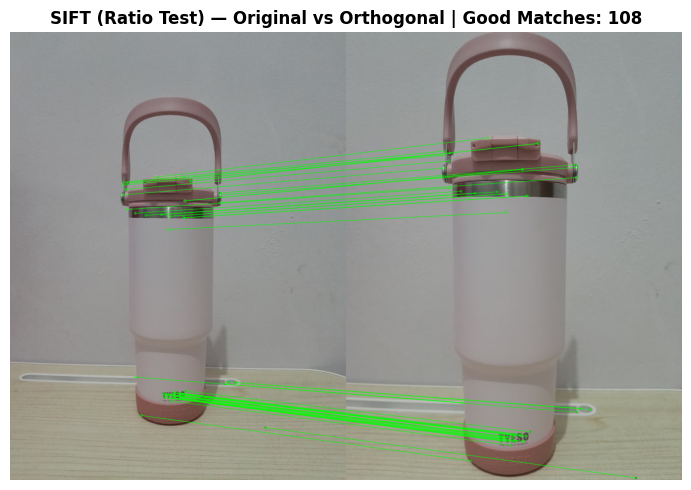

✅ SIFT vs Orthogonal: 108 good matches


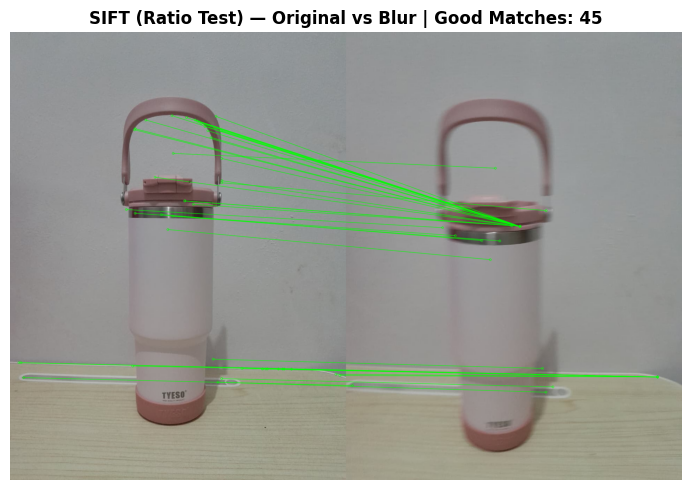

✅ SIFT vs Blur: 45 good matches


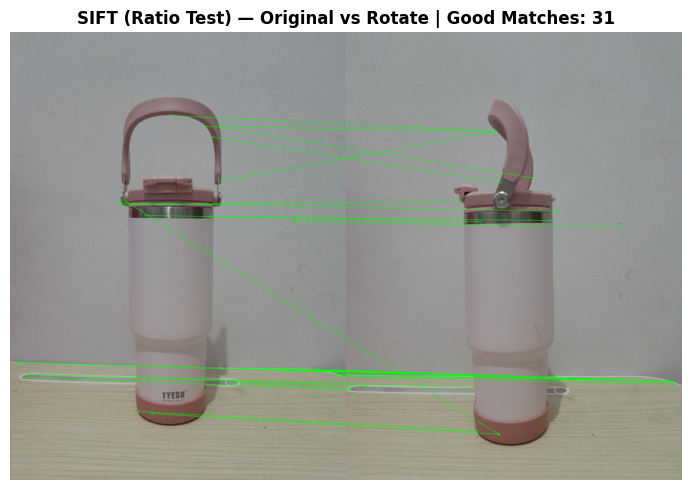

✅ SIFT vs Rotate: 31 good matches


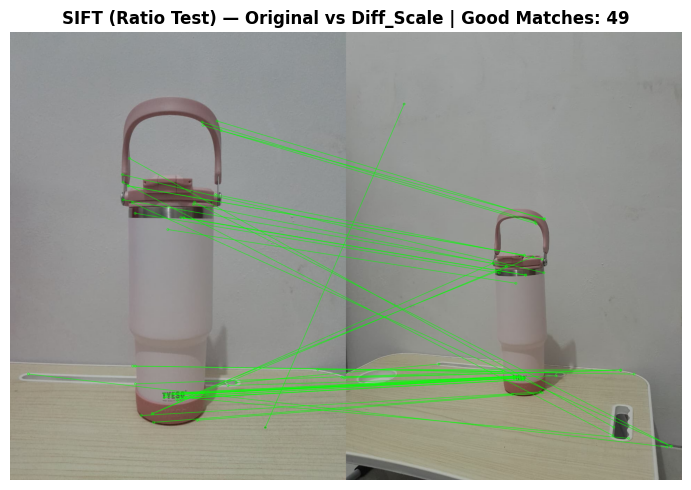

✅ SIFT vs Diff_Scale: 49 good matches


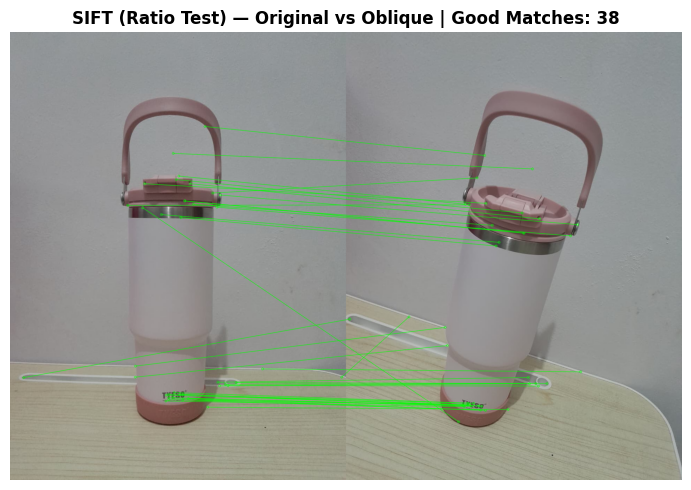

✅ SIFT vs Oblique: 38 good matches


In [ ]:
# ============================================
# SIFT dengan Ratio Test (Lowe's)
# ============================================
sift = cv2.SIFT_create()

# Detect keypoints
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)
kp3, des3 = sift.detectAndCompute(gray3, None)
kp4, des4 = sift.detectAndCompute(gray4, None)
kp5, des5 = sift.detectAndCompute(gray5, None)
kp6, des6 = sift.detectAndCompute(gray6, None)

# BFMatcher dengan knnMatch + Ratio Test
bf = cv2.BFMatcher()

def sift_ratio_match(des_a, des_b, ratio=0.75):
    """Match dengan Lowe's ratio test — filter false matches"""
    raw = bf.knnMatch(des_a, des_b, k=2)
    good = [m for m, n in raw if m.distance < ratio * n.distance]
    return sorted(good, key=lambda x: x.distance)

# Matching semua kondisi vs original
titles    = ['Orthogonal', 'Blur', 'Rotate', 'Diff_Scale', 'Oblique']
imgs2     = [img2, img3, img4, img5, img6]
kps2      = [kp2, kp3, kp4, kp5, kp6]
dess2     = [des2, des3, des4, des5, des6]

good_matchs = []

for title, img2i, kp2i, des2i in zip(titles, imgs2, kps2, dess2):
    matches = sift_ratio_match(des1, des2i)
    good_matchs.append(matches)

    result = cv2.drawMatches(
        img1, kp1, img2i, kp2i,
        matches[:50], None,
        matchColor=(0, 255, 0),
        singlePointColor=(255, 0, 0),
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    plt.figure(figsize=(14, 5))
    plt.title(f'SIFT (Ratio Test) — Original vs {title} | Good Matches: {len(matches)}',
              fontsize=12, fontweight='bold')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'SIFT_ratiotest_vs_{title}.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✅ SIFT vs {title}: {len(matches)} good matches")

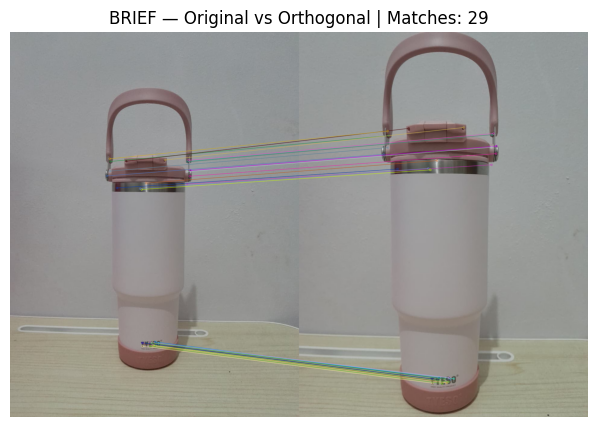

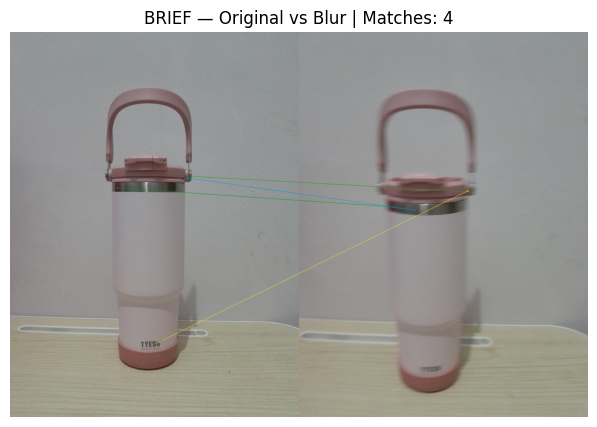

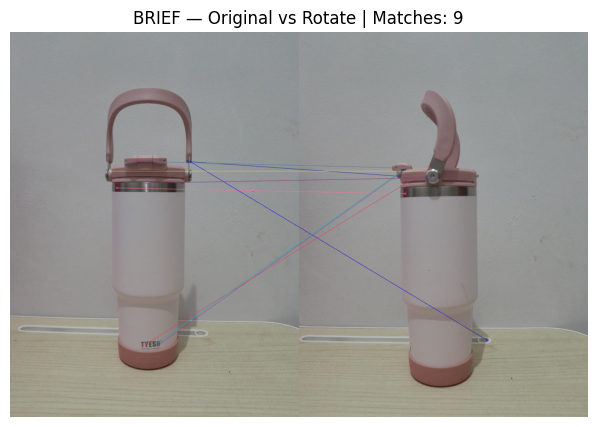

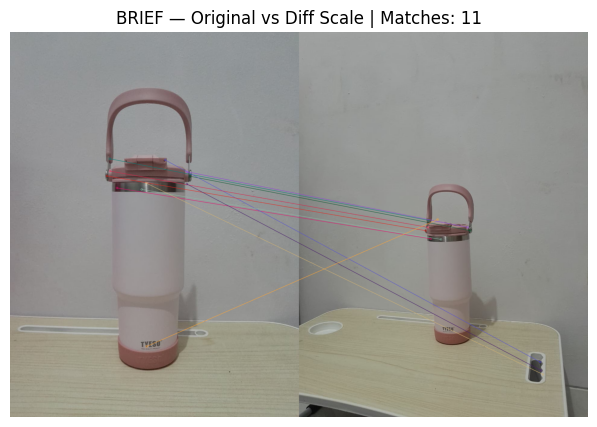

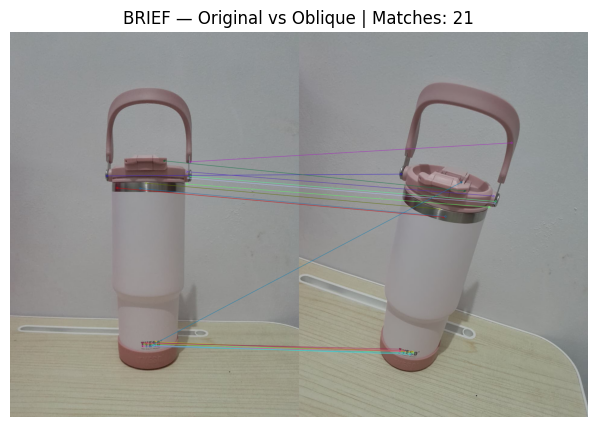

In [ ]:
# ===== BRIEF =====
# BRIEF butuh keypoint dulu dari detektor lain (misal STAR/CenSurE)
star = cv2.xfeatures2d.StarDetector_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

grays = [gray1,gray2,gray3,gray4,gray5,gray6]
kps_brief = []
des_brief  = []

for g in grays:
    kp = star.detect(g, None)
    kp, des = brief.compute(g, kp)
    kps_brief.append(kp)
    des_brief.append(des)

bf2 = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
brief_matchs = []
labels = ['Orthogonal','Blur','Rotate','Diff Scale','Oblique']

for i in range(1, 6):
    if des_brief[0] is not None and des_brief[i] is not None:
        m = sorted(bf2.match(des_brief[0], des_brief[i]), key=lambda x:x.distance)
        brief_matchs.append(m)
        result = cv2.drawMatches(img1,kps_brief[0],
                                 [img2,img3,img4,img5,img6][i-1],
                                 kps_brief[i],m[:50],None,flags=2)
        plt.figure(figsize=(14,5))
        plt.title(f'BRIEF — Original vs {labels[i-1]} | Matches: {len(m)}')
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()
    else:
        brief_matchs.append([])
        print(f"BRIEF: No descriptor for {labels[i-1]}")

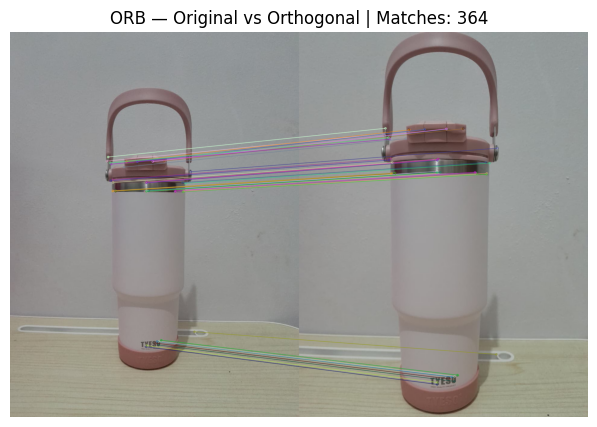

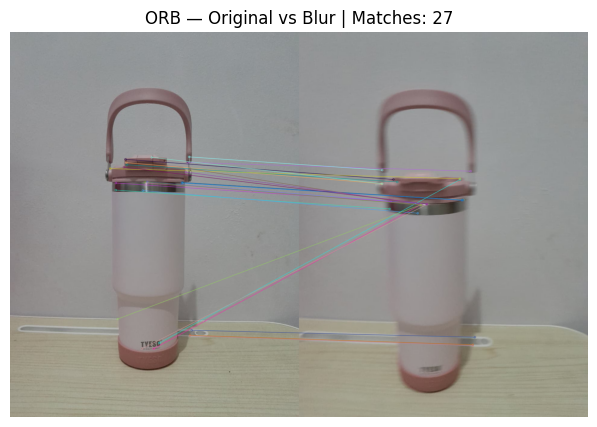

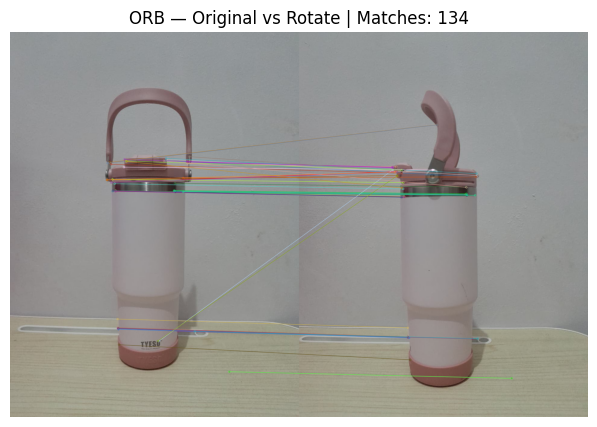

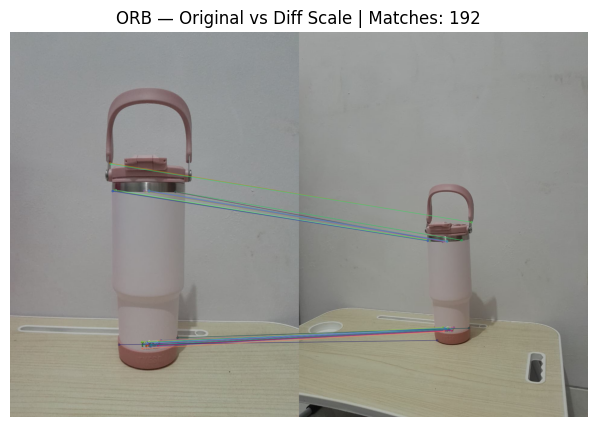

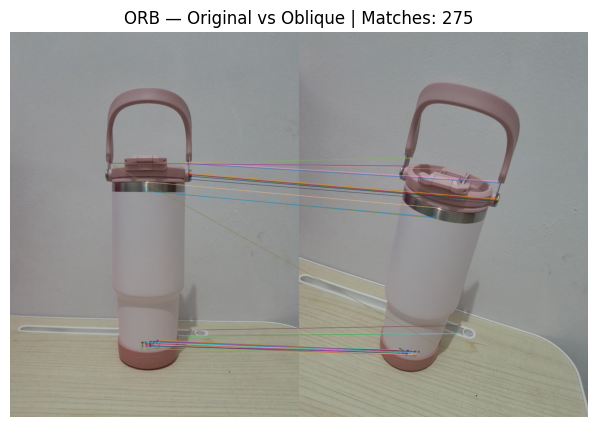

In [ ]:
# ===== ORB =====
orb = cv2.ORB_create(nfeatures=2000)

kps_orb = []
des_orb  = []
for g in grays:
    kp, des = orb.detectAndCompute(g, None)
    kps_orb.append(kp)
    des_orb.append(des)

bf3 = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
orb_matchs = []

for i in range(1, 6):
    m = sorted(bf3.match(des_orb[0], des_orb[i]), key=lambda x:x.distance)
    orb_matchs.append(m)
    result = cv2.drawMatches(img1,kps_orb[0],
                             [img2,img3,img4,img5,img6][i-1],
                             kps_orb[i],m[:50],None,flags=2)
    plt.figure(figsize=(14,5))
    plt.title(f'ORB — Original vs {labels[i-1]} | Matches: {len(m)}')
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [ ]:
import pandas as pd

data = {
    'Kondisi': labels,
    'SIFT Matches': [len(m) for m in good_sift_matches_recomputed],
    'BRIEF Matches': [len(m) for m in brief_matchs],
    'ORB Matches': [len(m) for m in orb_matchs]
}
df = pd.DataFrame(data)
print(df.to_string(index=False))

   Kondisi  SIFT Matches  BRIEF Matches  ORB Matches
Orthogonal           108             29          364
      Blur            45              4           27
    Rotate            31              9          134
Diff Scale            49             11          192
   Oblique            38             21          275


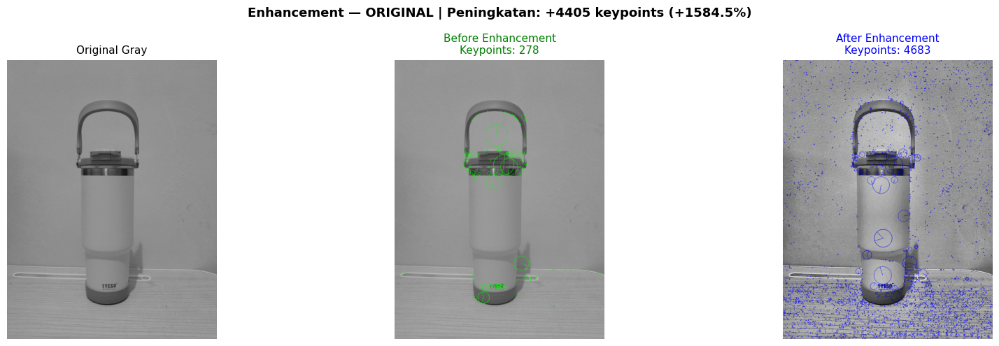

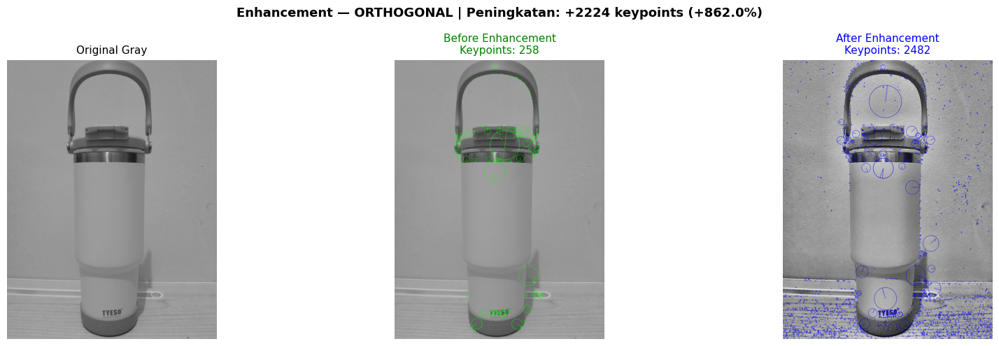

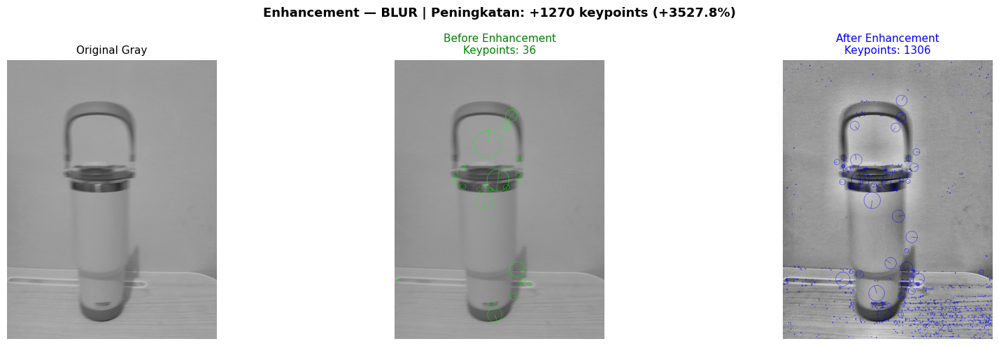

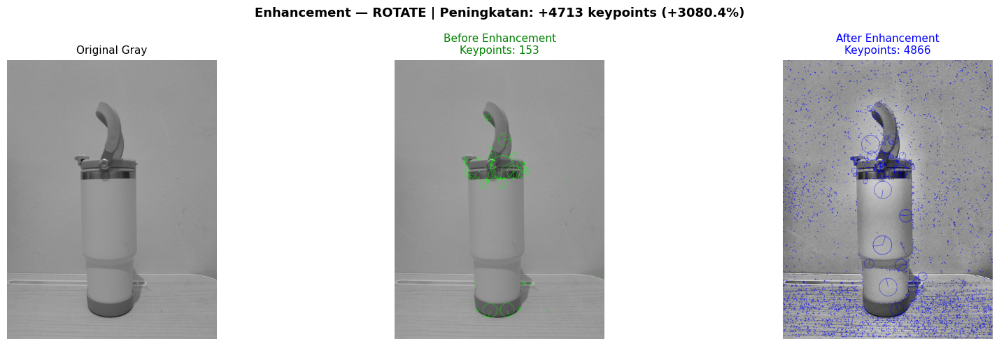

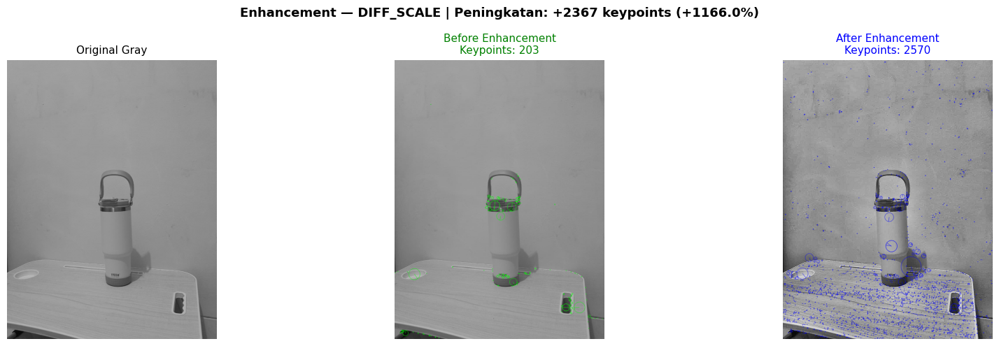

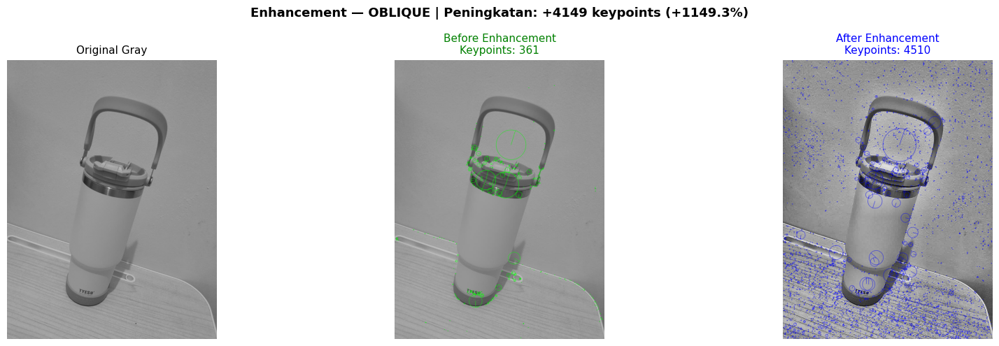


HASIL IMAGE ENHANCEMENT — RINGKASAN
Gambar             Sebelum    Sesudah    Selisih        %
-------------------------------------------------------
original               278       4683      +4405 +1584.5%
orthogonal             258       2482      +2224  +862.0%
blur                    36       1306      +1270 +3527.8%
rotate                 153       4866      +4713 +3080.4%
diff_scale             203       2570      +2367 +1166.0%
oblique                361       4510      +4149 +1149.3%


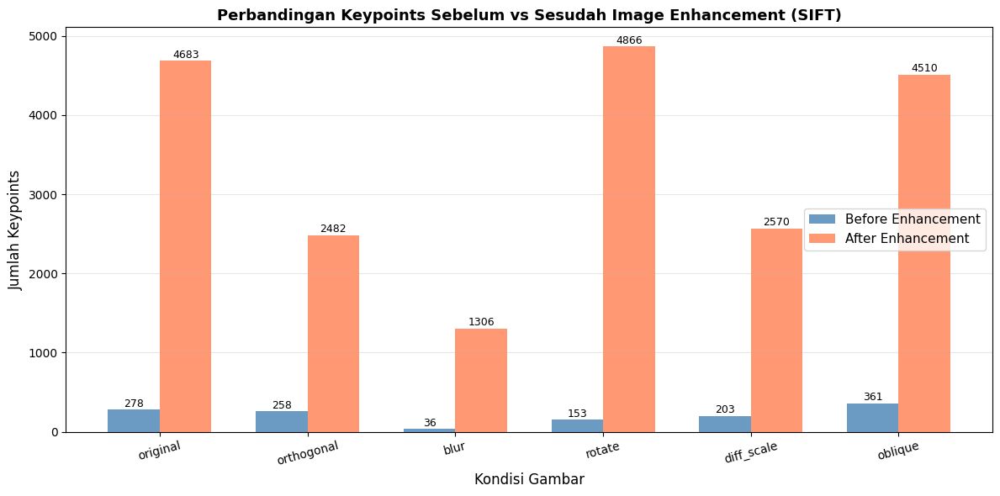

In [ ]:
# ============================================
# IMAGE ENHANCEMENT
# ============================================
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
kernel_sharp = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
sift = cv2.SIFT_create() # SIFT object is created here and is up-to-date

labels_name = ['original', 'orthogonal', 'blur', 'rotate', 'diff_scale', 'oblique']
images_list = [img1, img2, img3, img4, img5, img6]
grays_list  = [gray1, gray2, gray3, gray4, gray5, gray6]

enhancement_results = {}

for key, img, gray in zip(labels_name, images_list, grays_list):

    # === FIX: Pastikan gray adalah 8-bit single channel ===
    if len(gray.shape) == 3:
        gray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)
    gray = gray.astype(np.uint8)

    # Enhancement
    enhanced = clahe.apply(gray)
    enhanced = cv2.filter2D(enhanced, -1, kernel_sharp)
    enhanced = np.clip(enhanced, 0, 255).astype(np.uint8)

    # Deteksi keypoint menggunakan objek sift yang sudah diinisialisasi di atas
    kp_before, _ = sift.detectAndCompute(gray, None)
    kp_after,  _ = sift.detectAndCompute(enhanced, None)

    enhancement_results[key] = {
        'before': len(kp_before),
        'after' : len(kp_after)
    }

    # Visualisasi
    img_before_kp = cv2.drawKeypoints(
        gray, kp_before, None,
        color=(0,255,0),
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    img_after_kp = cv2.drawKeypoints(
        enhanced, kp_after, None,
        color=(0,0,255),
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].imshow(gray, cmap='gray')
    axes[0].set_title('Original Gray', fontsize=11)
    axes[0].axis('off')

    axes[1].imshow(img_before_kp, cmap='gray')
    axes[1].set_title(f'Before Enhancement\nKeypoints: {len(kp_before)}',
                      fontsize=11, color='green')
    axes[1].axis('off')

    axes[2].imshow(img_after_kp, cmap='gray')
    axes[2].set_title(f'After Enhancement\nKeypoints: {len(kp_after)}',
                      fontsize=11, color='blue')
    axes[2].axis('off')

    diff = len(kp_after) - len(kp_before)
    pct  = (diff / len(kp_before) * 100) if len(kp_before) > 0 else 0

    fig.suptitle(
        f'Enhancement — {key.upper()} | Peningkatan: {diff:+d} keypoints ({pct:+.1f}%)',
        fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'enhancement_{key}.png', dpi=150, bbox_inches='tight')
    plt.show()

# Tabel ringkasan
print("\n" + "="*55)
print("HASIL IMAGE ENHANCEMENT — RINGKASAN")
print("="*55)
print(f"{'Gambar':<15} {'Sebelum':>10} {'Sesudah':>10} {'Selisih':>10} {'%':>8}")
print("-"*55)

labels_chart  = []
before_values = []
after_values  = []

for key, val in enhancement_results.items():
    diff = val['after'] - val['before']
    pct  = (diff / val['before'] * 100) if val['before'] > 0 else 0
    print(f"{key:<15} {val['before']:>10} {val['after']:>10} {diff:>+10} {pct:>+7.1f}%")
    labels_chart.append(key)
    before_values.append(val['before'])
    after_values.append(val['after'])

# Bar chart
x     = np.arange(len(labels_chart))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width/2, before_values, width,
               label='Before Enhancement', color='steelblue', alpha=0.8)
bars2 = ax.bar(x + width/2, after_values, width,
               label='After Enhancement', color='coral', alpha=0.8)

for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
            str(int(bar.get_height())), ha='center', va='bottom', fontsize=9)
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
            str(int(bar.get_height())), ha='center', va='bottom', fontsize=9)

ax.set_xlabel('Kondisi Gambar', fontsize=12)
ax.set_ylabel('Jumlah Keypoints', fontsize=12)
ax.set_title('Perbandingan Keypoints Sebelum vs Sesudah Image Enhancement (SIFT)',
             fontsize=13, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(labels_chart, rotation=15)
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('enhancement_chart.png', dpi=150, bbox_inches='tight')
plt.show()

Keypoints sebelum improvement: 278
Keypoints setelah improvement: 4683


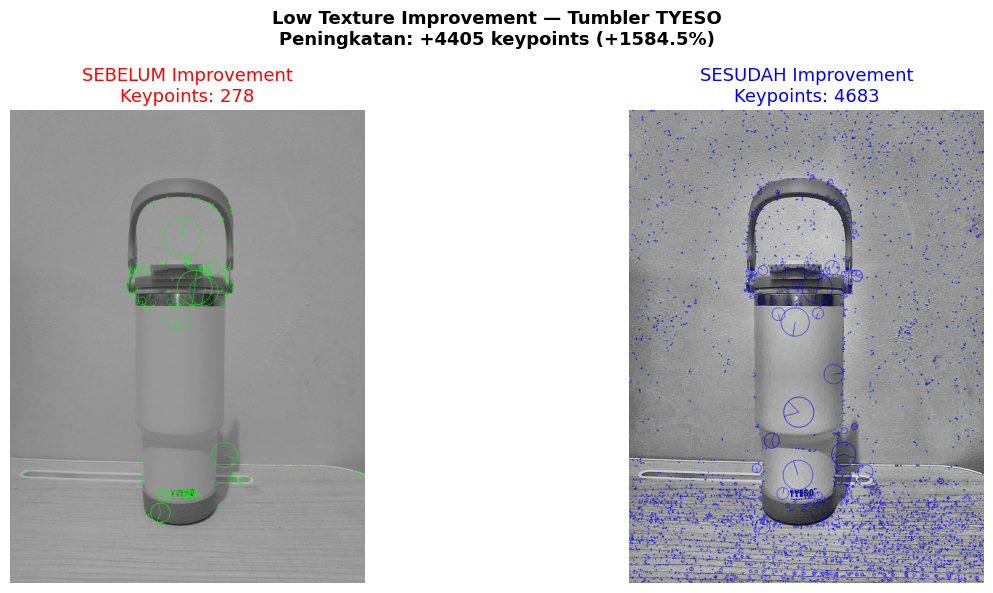

In [ ]:
# Buat versi "lebih low texture" dari original
# dengan cara blur ekstrem dulu baru deteksi
img_low_sim = cv2.GaussianBlur(img1, (51,51), 0)
gray_low_sim = cv2.cvtColor(img_low_sim, cv2.COLOR_BGR2GRAY)

# Improvement
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
kernel_sharp = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])

gray_low = gray1.astype(np.uint8)  # pakai gray1 yang sudah ada

kp_low, _ = sift.detectAndCompute(gray_low, None) # Menggunakan objek sift yang sudah diinisialisasi terakhir
print(f"Keypoints sebelum improvement: {len(kp_low)}")

clahe_low = clahe.apply(gray_low)
sharpened = cv2.filter2D(clahe_low, -1, kernel_sharp)
sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)

kp_improved, _ = sift.detectAndCompute(sharpened, None) # Menggunakan objek sift yang sudah diinisialisasi terakhir
print(f"Keypoints setelah improvement: {len(kp_improved)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(cv2.drawKeypoints(gray_low, kp_low, None, color=(0,255,0),
               flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), cmap='gray')
axes[0].set_title(f'SEBELUM Improvement\nKeypoints: {len(kp_low)}', fontsize=13, color='red')
axes[0].axis('off')

axes[1].imshow(cv2.drawKeypoints(sharpened, kp_improved, None, color=(0,0,255),
               flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), cmap='gray')
axes[1].set_title(f'SESUDAH Improvement\nKeypoints: {len(kp_improved)}', fontsize=13, color='blue')
axes[1].axis('off')

diff = len(kp_improved) - len(kp_low)
pct  = (diff / len(kp_low) * 100) if len(kp_low) > 0 else 0
plt.suptitle(f'Low Texture Improvement — Tumbler TYESO\nPeningkatan: {diff:+d} keypoints ({pct:+.1f}%)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('low_texture_improvement.png', dpi=150, bbox_inches='tight')
plt.show()

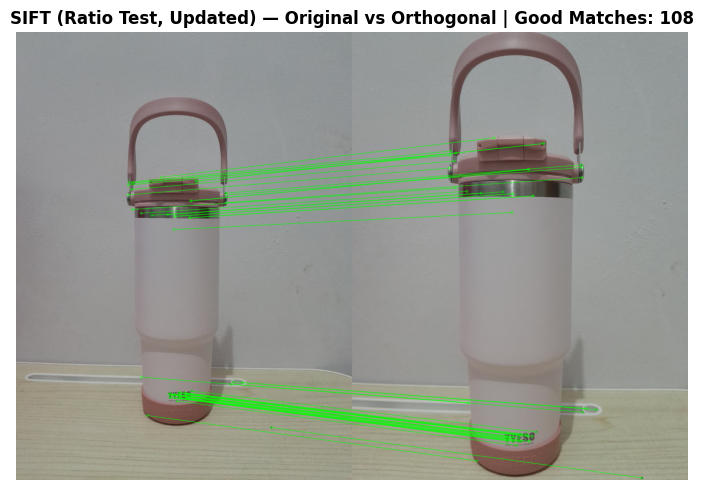

✅ SIFT (Updated) vs Orthogonal: 108 good matches


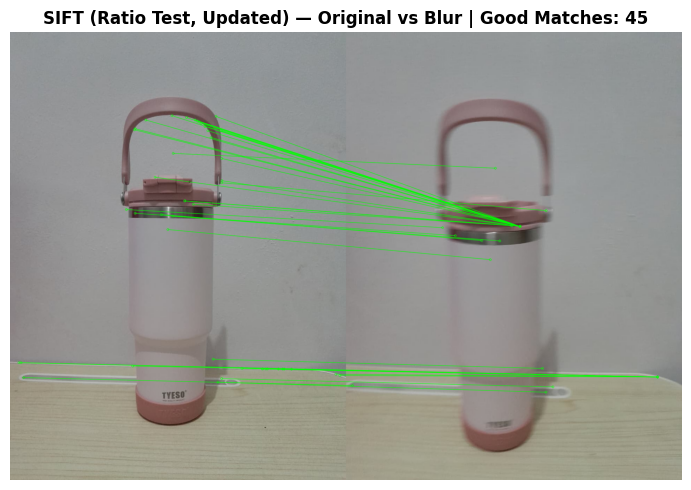

✅ SIFT (Updated) vs Blur: 45 good matches


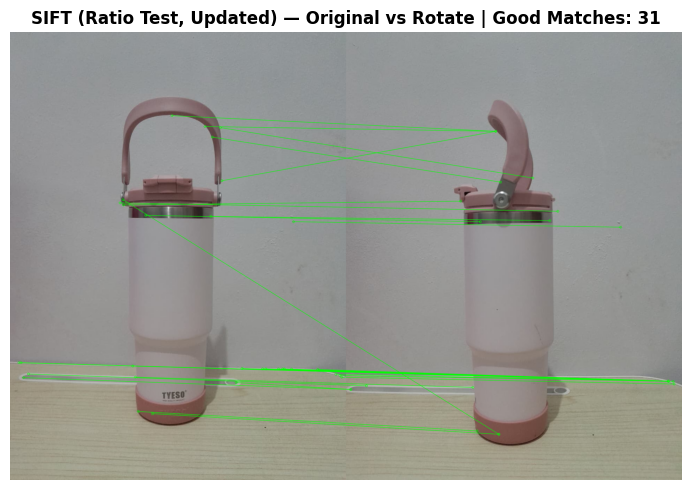

✅ SIFT (Updated) vs Rotate: 31 good matches


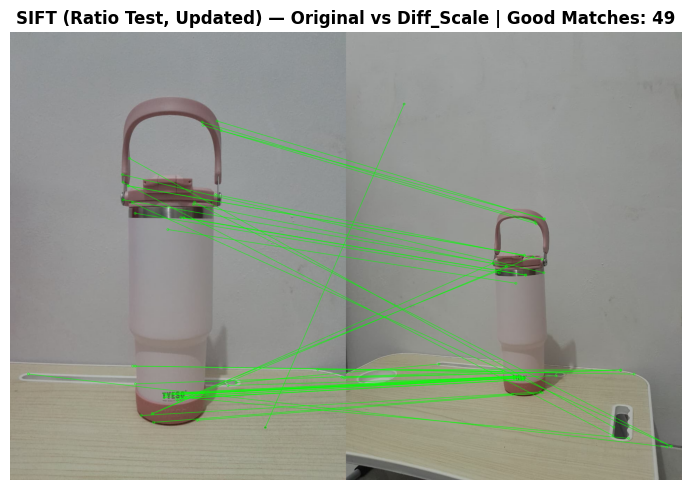

✅ SIFT (Updated) vs Diff_Scale: 49 good matches


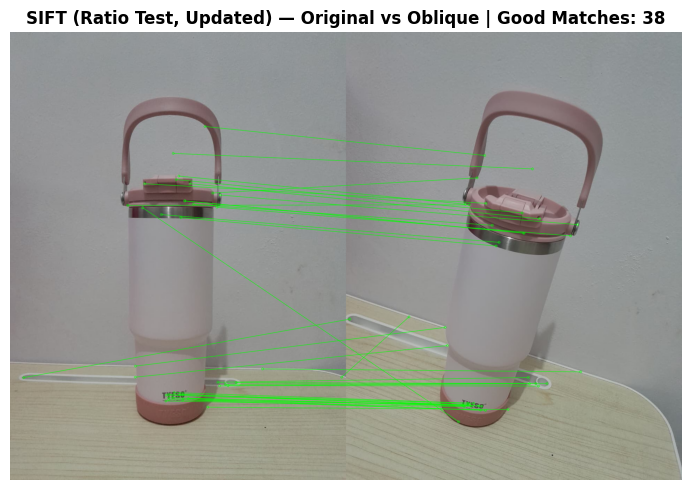

✅ SIFT (Updated) vs Oblique: 38 good matches


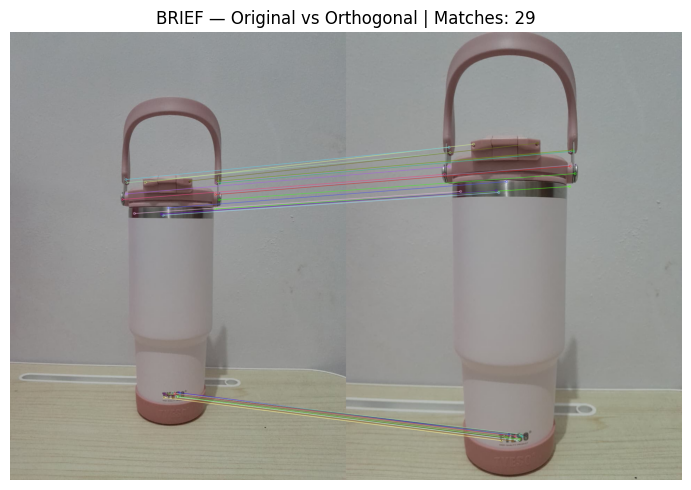

✅ Tersimpan: BRIEF_vs_Orthogonal.png


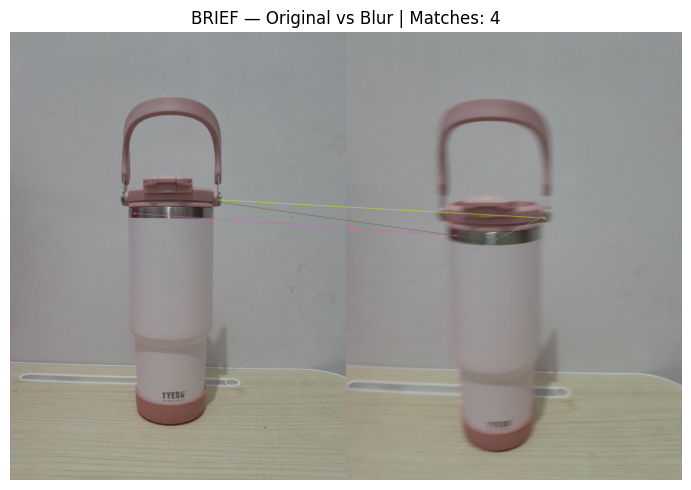

✅ Tersimpan: BRIEF_vs_Blur.png


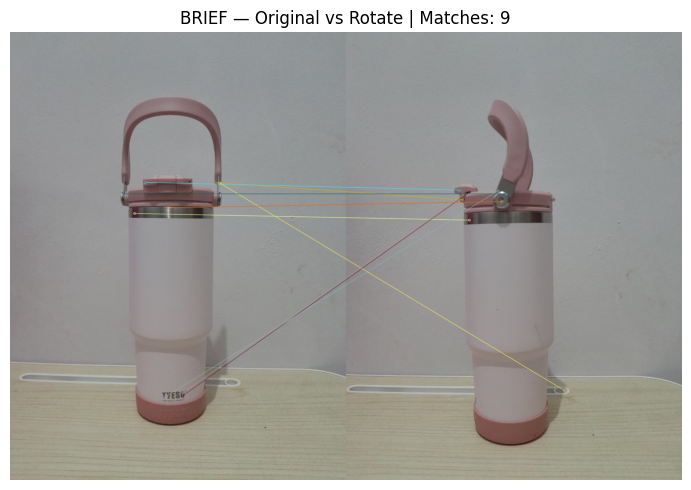

✅ Tersimpan: BRIEF_vs_Rotate.png


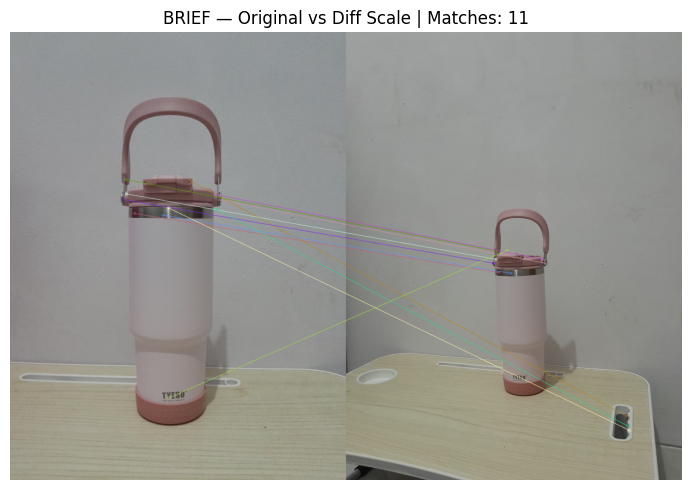

✅ Tersimpan: BRIEF_vs_Diff Scale.png


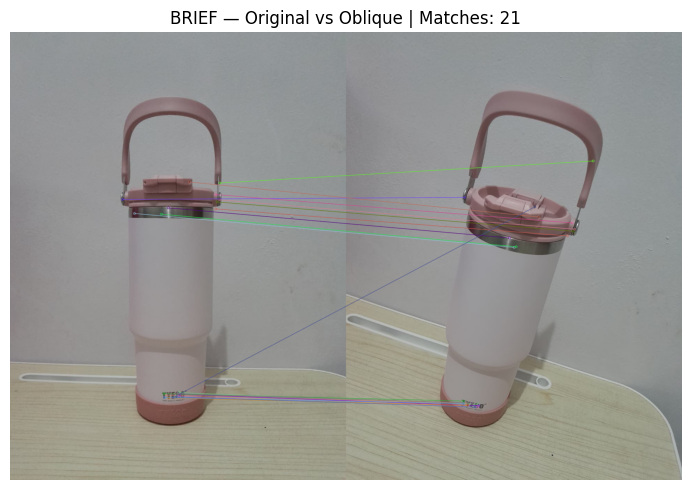

✅ Tersimpan: BRIEF_vs_Oblique.png


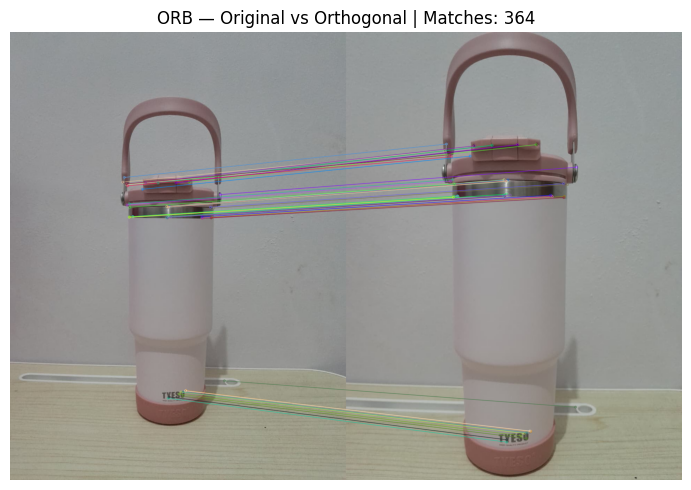

✅ Tersimpan: ORB_vs_Orthogonal.png


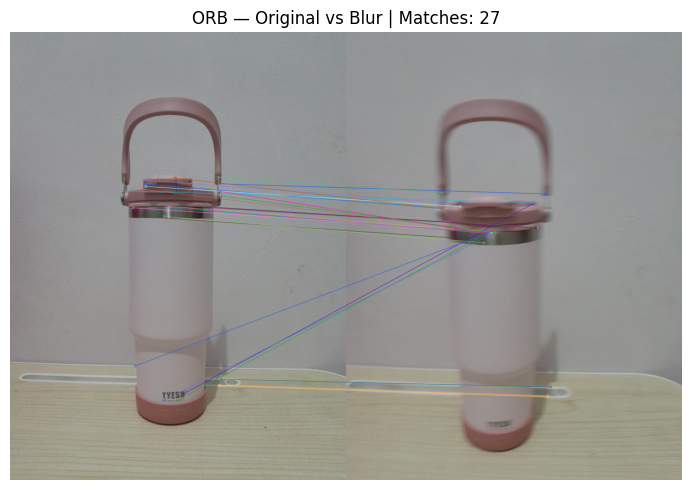

✅ Tersimpan: ORB_vs_Blur.png


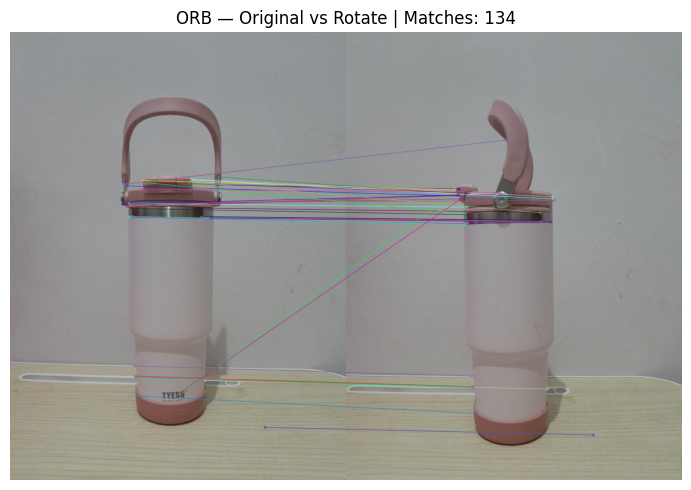

✅ Tersimpan: ORB_vs_Rotate.png


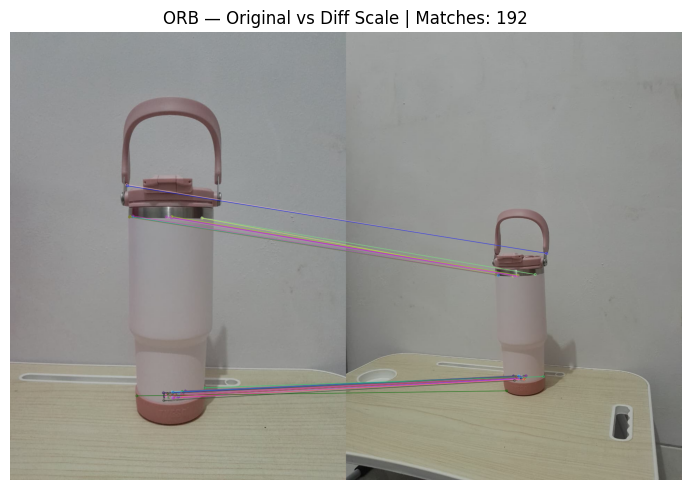

✅ Tersimpan: ORB_vs_Diff Scale.png


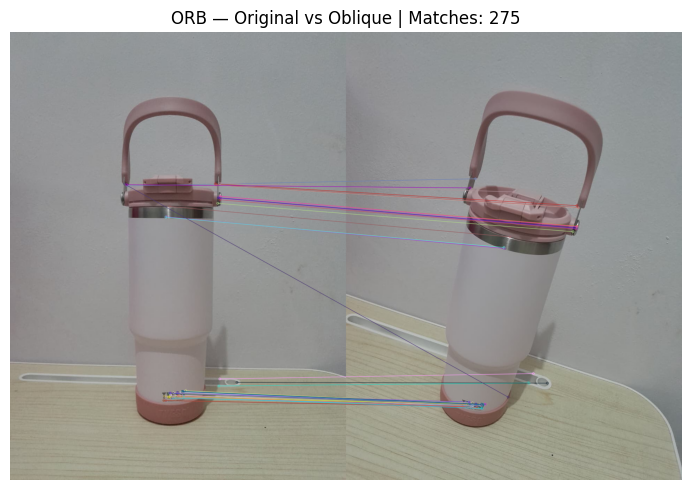

✅ Tersimpan: ORB_vs_Oblique.png

📁 Total file tersimpan: 42
  - BRIEF_vs_Blur.png
  - BRIEF_vs_Diff Scale.png
  - BRIEF_vs_Diff_Scale.png
  - BRIEF_vs_Oblique.png
  - BRIEF_vs_Orthogonal.png
  - BRIEF_vs_Rotate.png
  - ORB_vs_Blur.png
  - ORB_vs_Diff Scale.png
  - ORB_vs_Diff_Scale.png
  - ORB_vs_Oblique.png
  - ORB_vs_Orthogonal.png
  - ORB_vs_Rotate.png
  - SIFT_ratiotest_updated_vs_Blur.png
  - SIFT_ratiotest_updated_vs_Diff_Scale.png
  - SIFT_ratiotest_updated_vs_Oblique.png
  - SIFT_ratiotest_updated_vs_Orthogonal.png
  - SIFT_ratiotest_updated_vs_Rotate.png
  - SIFT_ratiotest_vs_Blur.png
  - SIFT_ratiotest_vs_Diff_Scale.png
  - SIFT_ratiotest_vs_Oblique.png
  - SIFT_ratiotest_vs_Orthogonal.png
  - SIFT_ratiotest_vs_Rotate.png
  - SIFT_vs_Blur.png
  - SIFT_vs_Diff_Scale.png
  - SIFT_vs_Oblique.png
  - SIFT_vs_Orthogonal.png
  - SIFT_vs_Rotate.png
  - blur.jpg
  - diff_scale.jpg
  - enhancement_blur.png
  - enhancement_chart.png
  - enhancement_diff_scale.png
  - enhancement_obliqu

In [ ]:
# ============================================
# SIFT — MATCHING + SAVE SEMUA KONDISI (UPDATED with latest SIFT object)
# ============================================

# The 'sift' object is the one re-initialized in cell NYdKO8z7FyPM.
# The 'bf' matcher was initialized in cell olbi1eUK_p3A.
# 'grays_list' and 'images_list' are from NYdKO8z7FyPM.

# Redefine sift_ratio_match to ensure it's available and uses the global 'bf'
def sift_ratio_match(des_a, des_b, ratio=0.75):
    """Match dengan Lowe's ratio test — filter false matches"""
    raw = bf.knnMatch(des_a, des_b, k=2)
    good = [m for m, n in raw if m.distance < ratio * n.distance]
    return sorted(good, key=lambda x: x.distance)

# Re-detect and compute keypoints and descriptors for all images
kps_sift_recomputed = []
des_sift_recomputed = []

for g in grays_list: # grays_list contains gray1 to gray6
    kp, des = sift.detectAndCompute(g, None)
    kps_sift_recomputed.append(kp)
    des_sift_recomputed.append(des)

# Reference image (original)
kp1_recomputed = kps_sift_recomputed[0]
des1_recomputed = des_sift_recomputed[0]

# Comparison images (orthogonal, blur, rotate, diff_scale, oblique)
kps_comparisons_recomputed = kps_sift_recomputed[1:]
des_comparisons_recomputed = des_sift_recomputed[1:]

titles_display = ['Orthogonal', 'Blur', 'Rotate', 'Diff_Scale', 'Oblique'] # For display titles and filenames
imgs_for_sift_matching = images_list[1:] # img2, img3, img4, img5, img6

good_sift_matches_recomputed = [] # This will replace the old 'good_matchs' if it was used elsewhere for SIFT

for i, title in enumerate(titles_display):
    current_img2_bgr = imgs_for_sift_matching[i]
    current_kp2 = kps_comparisons_recomputed[i]
    current_des2 = des_comparisons_recomputed[i]

    if des1_recomputed is not None and current_des2 is not None:
        matches = sift_ratio_match(des1_recomputed, current_des2)
        good_sift_matches_recomputed.append(matches)

        result = cv2.drawMatches(
            img1, kp1_recomputed, current_img2_bgr, current_kp2,
            matches[:50], None,
            matchColor=(0, 255, 0),
            singlePointColor=(255, 0, 0),
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

        plt.figure(figsize=(14, 5))
        plt.title(f'SIFT (Ratio Test, Updated) — Original vs {title} | Good Matches: {len(matches)}',
                  fontsize=12, fontweight='bold')
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f'SIFT_ratiotest_updated_vs_{title}.png', dpi=150, bbox_inches='tight')
        plt.show()
        print(f"✅ SIFT (Updated) vs {title}: {len(matches)} good matches")
    else:
        good_sift_matches_recomputed.append([])
        print(f"⚠️ SIFT (Updated) skip {title} — descriptor kosong")

# ============================================
# BRIEF — MATCHING + SAVE SEMUA KONDISI
# ============================================
labels = ['Orthogonal', 'Blur', 'Rotate', 'Diff Scale', 'Oblique']
imgs_list = [img2, img3, img4, img5, img6]

for i in range(1, 6):
    label    = labels[i-1]
    img2i    = imgs_list[i-1]

    if des_brief[0] is not None and des_brief[i] is not None:
        m = sorted(
            bf2.match(des_brief[0], des_brief[i]),
            key=lambda x: x.distance)

        result = cv2.drawMatches(
            img1, kps_brief[0],
            img2i, kps_brief[i],
            m[:50], None, flags=2)

        plt.figure(figsize=(14, 5))
        plt.title(f'BRIEF — Original vs {label} | Matches: {len(m)}')
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f'BRIEF_vs_{label}.png', dpi=150, bbox_inches='tight')  # ← SAVE
        plt.show()
        print(f"✅ Tersimpan: BRIEF_vs_{label}.png")
    else:
        print(f"⚠️ BRIEF skip {label} — descriptor kosong")

# ============================================
# ORB — MATCHING + SAVE SEMUA KONDISI
# ============================================
for i in range(1, 6):
    label = labels[i-1]
    img2i = imgs_list[i-1]

    if des_orb[0] is not None and des_orb[i] is not None:
        m = sorted(
            bf3.match(des_orb[0], des_orb[i]),
            key=lambda x: x.distance)

        result = cv2.drawMatches(
            img1, kps_orb[0],
            img2i, kps_orb[i],
            m[:50], None, flags=2)

        plt.figure(figsize=(14, 5))
        plt.title(f'ORB — Original vs {label} | Matches: {len(m)}')
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.tight_layout()
        plt.savefig(f'ORB_vs_{label}.png', dpi=150, bbox_inches='tight')  # ← SAVE
        plt.show()
        print(f"✅ Tersimpan: ORB_vs_{label}.png")
    else:
        print(f"⚠️ ORB skip {label} — descriptor kosong")

# ============================================
# CEK SEMUA FILE TERSIMPAN
# ============================================
import os
saved = sorted([f for f in os.listdir('/content/')
                if f.endswith('.png') or f.endswith('.jpg')])
print(f"\n📁 Total file tersimpan: {len(saved)}")
for f in saved:
    print(f"  - {f}")

In [ ]:
# ============================================
# DOWNLOAD SEMUA DALAM ZIP
# ============================================
from google.colab import files
import zipfile, os

zip_name = 'hasil_feature_detection.zip'

with zipfile.ZipFile(zip_name, 'w') as zipf:
    saved = sorted([f for f in os.listdir('/content/')
                    if f.endswith('.png') or f.endswith('.jpg')])
    for f in saved:
        zipf.write(f'/content/{f}', f)
        print(f"  ✅ {f}")

print(f"\n📦 Total {len(saved)} file dalam ZIP")
files.download(zip_name)
print("⬇️ Download dimulai!")

  ✅ BRIEF_vs_Blur.png
  ✅ BRIEF_vs_Diff Scale.png
  ✅ BRIEF_vs_Diff_Scale.png
  ✅ BRIEF_vs_Oblique.png
  ✅ BRIEF_vs_Orthogonal.png
  ✅ BRIEF_vs_Rotate.png
  ✅ ORB_vs_Blur.png
  ✅ ORB_vs_Diff Scale.png
  ✅ ORB_vs_Diff_Scale.png
  ✅ ORB_vs_Oblique.png
  ✅ ORB_vs_Orthogonal.png
  ✅ ORB_vs_Rotate.png
  ✅ SIFT_ratiotest_updated_vs_Blur.png
  ✅ SIFT_ratiotest_updated_vs_Diff_Scale.png
  ✅ SIFT_ratiotest_updated_vs_Oblique.png
  ✅ SIFT_ratiotest_updated_vs_Orthogonal.png
  ✅ SIFT_ratiotest_updated_vs_Rotate.png
  ✅ SIFT_ratiotest_vs_Blur.png
  ✅ SIFT_ratiotest_vs_Diff_Scale.png
  ✅ SIFT_ratiotest_vs_Oblique.png
  ✅ SIFT_ratiotest_vs_Orthogonal.png
  ✅ SIFT_ratiotest_vs_Rotate.png
  ✅ SIFT_vs_Blur.png
  ✅ SIFT_vs_Diff_Scale.png
  ✅ SIFT_vs_Oblique.png
  ✅ SIFT_vs_Orthogonal.png
  ✅ SIFT_vs_Rotate.png
  ✅ blur.jpg
  ✅ diff_scale.jpg
  ✅ enhancement_blur.png
  ✅ enhancement_chart.png
  ✅ enhancement_diff_scale.png
  ✅ enhancement_oblique.png
  ✅ enhancement_original.png
  ✅ enhancement_orthogona

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️ Download dimulai!
